In [1]:
import pandas as pd
from pathlib import Path
import IPython.display as display
from IPython.display import Audio, Image
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image as PILImage
import io



In [2]:
# <- EDIT THIS
PARQUET_PATH = Path("data/alignment_subsets/valor32k_train_shards/valor32k_train_batch000_shard000.parquet")

assert PARQUET_PATH.is_file(), f"Parquet not found: {PARQUET_PATH}"
print("Loading:", PARQUET_PATH)

df = pd.read_parquet(PARQUET_PATH)
print("Loaded rows:", len(df))
df.head(3)


Loading: data/alignment_subsets/valor32k_train_shards/valor32k_train_batch000_shard000.parquet
Loaded rows: 200


,video_id,yt_id,start,end,caption,image_jpegs,audio_wav
0,x-2Abohj8VY_30.000_40.000,x-2Abohj8VY,30.0,40.0,"With the rumble, on a moving bus, a crowd spoke.",[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x0...,b'RIFF\xff\xff\xff\xffWAVEfmt \x10\x00\x00\x00...
1,ILE12hEW5Ck_30.000_40.000,ILE12hEW5Ck,30.0,40.0,"In one room, a group of women were dancing dis...",[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x0...,b'RIFF\xff\xff\xff\xffWAVEfmt \x10\x00\x00\x00...
2,o2bqT0ZTz7E_70.000_80.000,o2bqT0ZTz7E,70.0,80.0,"To the music, a man in a blue shirt sings whil...",[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x0...,b'RIFF\xff\xff\xff\xffWAVEfmt \x10\x00\x00\x00...


In [3]:
# Select first 3 samples
samples = df.iloc[:3]
samples


,video_id,yt_id,start,end,caption,image_jpegs,audio_wav
0,x-2Abohj8VY_30.000_40.000,x-2Abohj8VY,30.0,40.0,"With the rumble, on a moving bus, a crowd spoke.",[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x0...,b'RIFF\xff\xff\xff\xffWAVEfmt \x10\x00\x00\x00...
1,ILE12hEW5Ck_30.000_40.000,ILE12hEW5Ck,30.0,40.0,"In one room, a group of women were dancing dis...",[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x0...,b'RIFF\xff\xff\xff\xffWAVEfmt \x10\x00\x00\x00...
2,o2bqT0ZTz7E_70.000_80.000,o2bqT0ZTz7E,70.0,80.0,"To the music, a man in a blue shirt sings whil...",[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x0...,b'RIFF\xff\xff\xff\xffWAVEfmt \x10\x00\x00\x00...


In [4]:
def decode_image(jpeg_bytes: bytes):
    return PILImage.open(io.BytesIO(jpeg_bytes))

def show_image(img):
    plt.figure(figsize=(4,4))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

def play_audio(wav_bytes: bytes, sample_rate=16000):
    return Audio(wav_bytes, rate=sample_rate)


SAMPLE 0
video_id : x-2Abohj8VY_30.000_40.000
caption  : With the rumble, on a moving bus, a crowd spoke.

📷 Image:


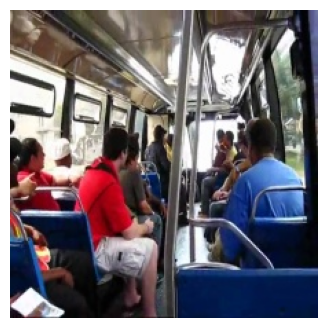


🔊 Audio preview:


SAMPLE 1
video_id : ILE12hEW5Ck_30.000_40.000
caption  : In one room, a group of women were dancing disco to dance music.

📷 Image:


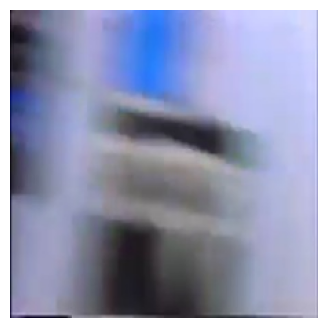


🔊 Audio preview:


SAMPLE 2
video_id : o2bqT0ZTz7E_70.000_80.000
caption  : To the music, a man in a blue shirt sings while two men play the piano.

📷 Image:


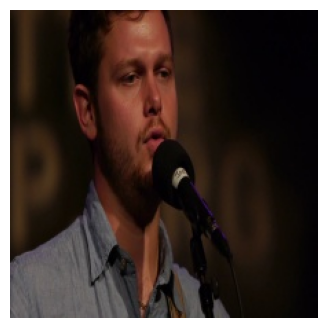


🔊 Audio preview:


In [7]:
for idx, row in samples.iterrows():
    print("="*80)
    print(f"SAMPLE {idx}")
    print("video_id :", row['video_id'])
    print("caption  :", row['caption'])
    
    # --- IMAGE ---
    print("\n📷 Image:")
    img = decode_image(row['image_jpegs'][0])
    show_image(img)

    # --- AUDIO ---
    print("\n🔊 Audio preview:")
    display.display(play_audio(row['audio_wav'], sample_rate=16000))
